# Stochastic Image Noising 
* Dataset : Caltech 101 Dataset Faces :https://data.caltech.edu/records/mzrjq-6wc02

* Use Stochastic Noise to noise the Face Images Dataset.

In [ ]:
# Necessary Imports
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.datasets as datasets
import torchvision.transforms as transforms
from torch.utils.data import DataLoader
import torchvision
import matplotlib.pyplot as plt
import numpy as np
import torch.utils.data as data_utils

In [ ]:
# Load images and Preprocess 

transform = transforms.Compose([
    transforms.Resize((128, 128)),
    transforms.ToTensor(),
    
])

# Load the Caltech 101 dataset
caltech101 = datasets.Caltech101(root='data', transform=transform, download=True)

# Specify the subclass to load (for example, "Airplanes")

subclass_indices = [i for i in range(len(caltech101)) if caltech101[i][1] == 0] 
training_dataset = data_utils.Subset(caltech101, subclass_indices)

# Set train and test size
train_size = int(0.8 * len(training_dataset))
test_size = len(training_dataset) - train_size

# Train test split 80-20 %
train_dataset, test_dataset = torch.utils.data.random_split(training_dataset, [train_size, test_size])

# Load train and test dataset
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=32, shuffle=False, num_workers=4)


Files already downloaded and verified


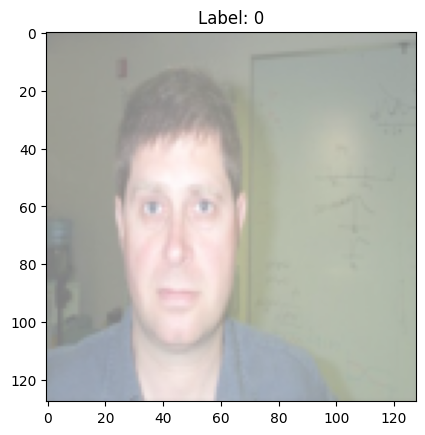

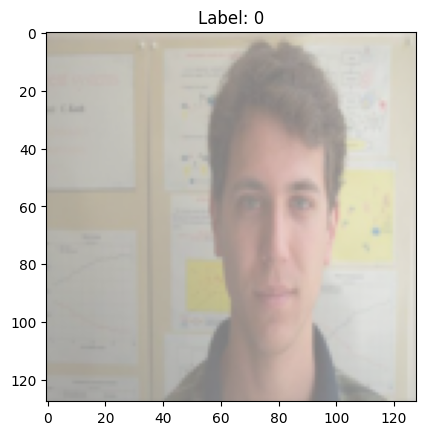

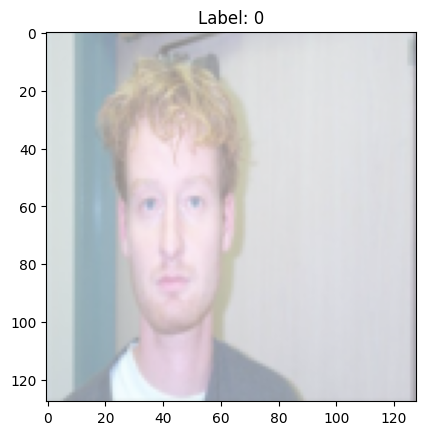

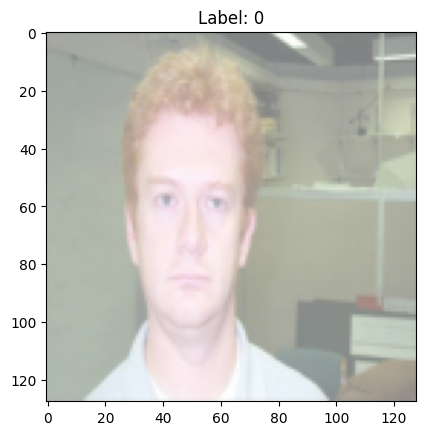

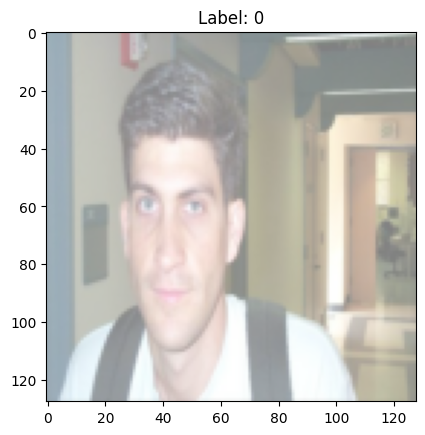

...

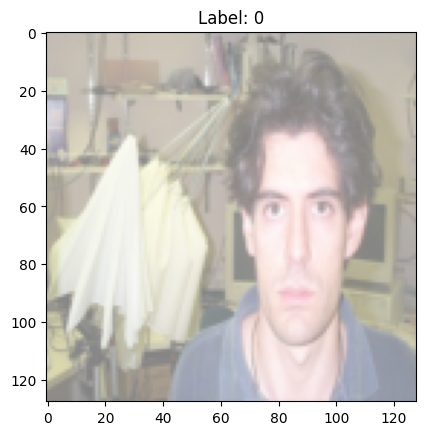

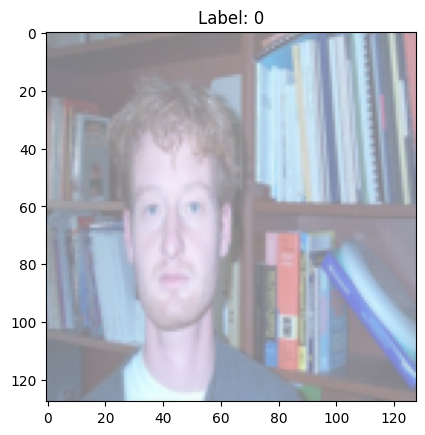

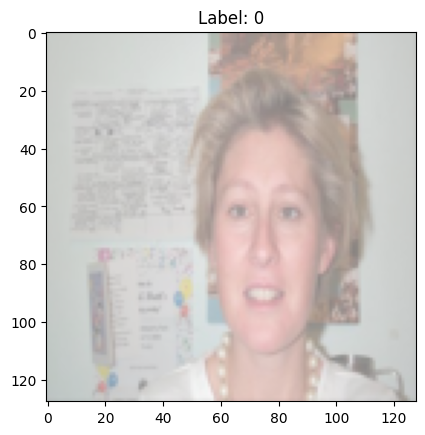

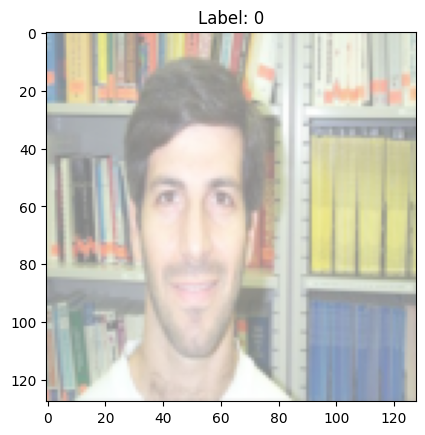

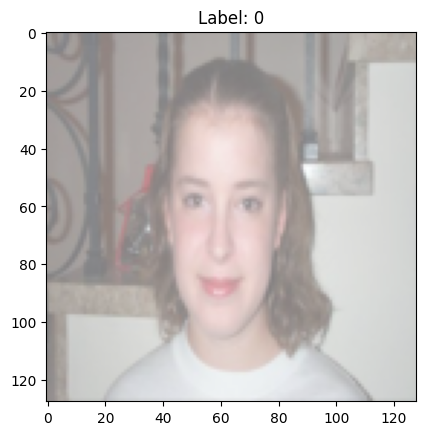

In [ ]:
# Visualize Images ne by one 
# Iterate over data loader
for batch in train_loader:
    # Get images and labels from the batch
    images, labels = batch
    
    # Visualize the images
    for i in range(images.size(0)):
        # Convert the image from tensor to numpy array
        image = images[i].numpy()
        
        # Undo the normalization transformation
        image = image * 0.5 + 0.5  # Assuming normalization mean=0.5 and std=0.5
        
        # Transpose image to (H, W, C) format
        image = np.transpose(image, (1, 2, 0))
        
        # Display image
        plt.imshow(image)
        plt.title(f'Label: {labels[i]}')
        plt.show()
        
    # Break after the first batch to visualize only a few images
    break


### Experimenting with noise 

In [ ]:
# define function to view image each time
def imshow(image, ax=None, title=None, normalize=True):
    """Imshow for Tensor."""
    if ax is None:
        fig, ax = plt.subplots()
        image = image.numpy().transpose((1, 2, 0))

        if normalize:
          mean = np.array([0.485, 0.456, 0.406])
          std = np.array([0.229, 0.224, 0.225])
          image = std * image + mean
          image = np.clip(image, 0, 1)

    ax.imshow(image)
    ax.spines['top'].set_visible(False)
    ax.spines['right'].set_visible(False)
    ax.spines['left'].set_visible(False)
    ax.spines['bottom'].set_visible(False)
    ax.tick_params(axis='both', length=0)
    ax.set_xticklabels('')
    ax.set_yticklabels('')

    return ax

In [ ]:
# Add Noise to entire dataset
# White Additive Noise
noisy_images = (images + torch.normal(0,0.2, images.shape)).clip(0,1)

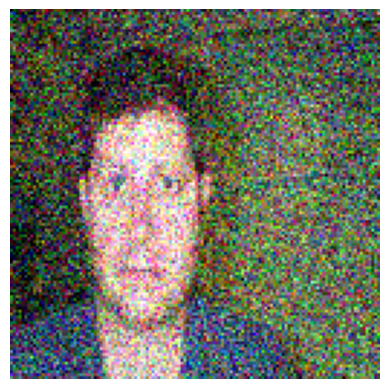

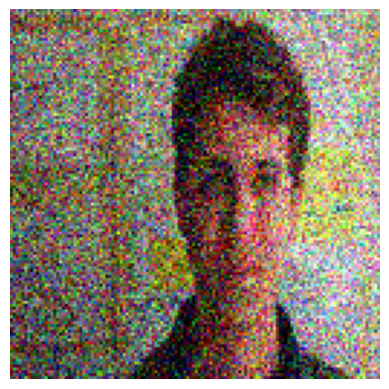

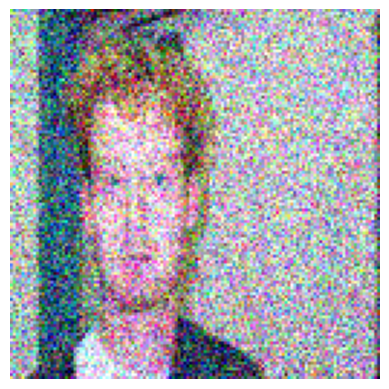

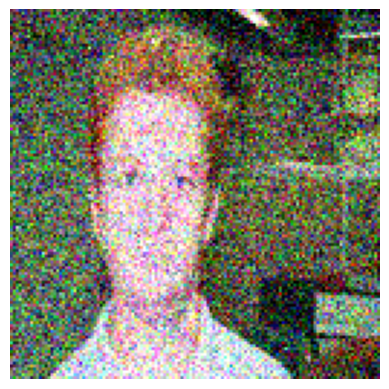

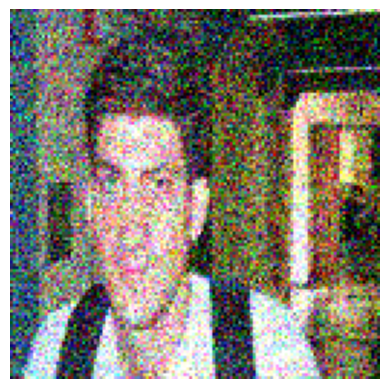

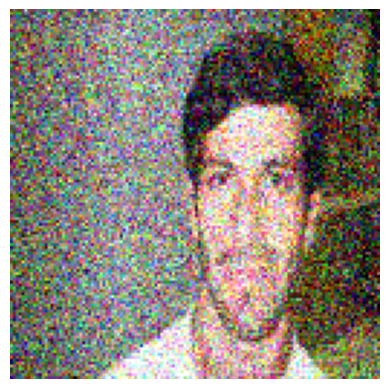

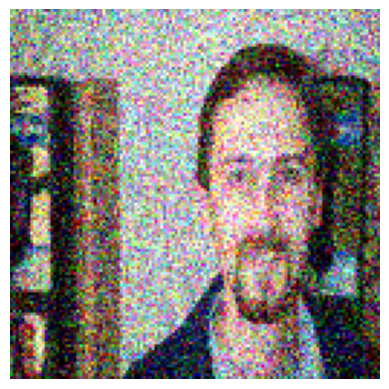

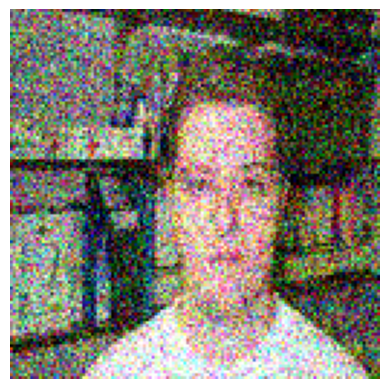

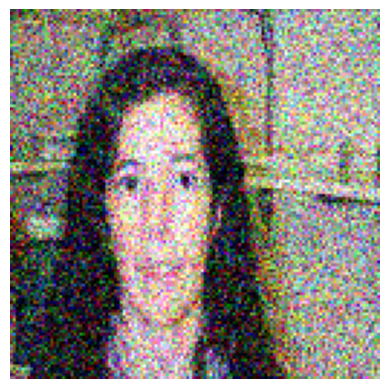

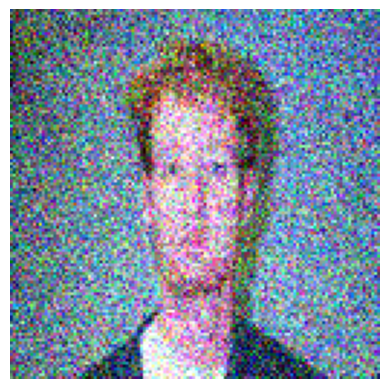

In [ ]:
# View output noised images
for i in range(10):
  imshow(noisy_images[i], normalize=False)

In [ ]:
# Bernoulli Noise
a = 0.7*torch.ones(images.shape)
bernoulli_noisy_images = images*torch.bernoulli(a)

<Axes: >

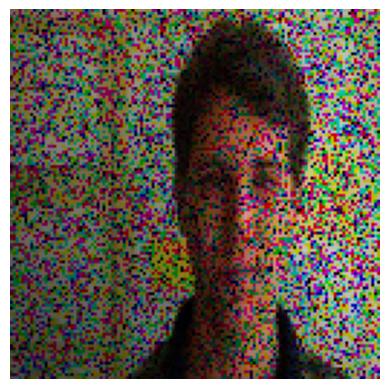

In [ ]:
# View output image
imshow(bernoulli_noisy_images[1], normalize=False)

<Axes: >

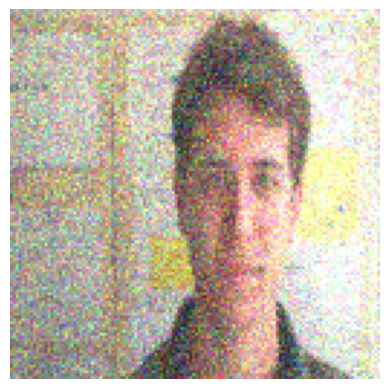

In [ ]:
# Poisson Noise 
a = 5*torch.ones(images.shape)
p = torch.poisson(a)
p_norm = p/p.max()
poisson_noisy_images = (images + p_norm).clip(0,1)

# View output Image
imshow(poisson_noisy_images[1], normalize=False)